In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [2]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Add, Concatenate, Dropout, GaussianNoise, UpSampling2D, Conv2DTranspose, Conv2D, Dense, Lambda, Input, Flatten, Reshape, BatchNormalization, ReLU, LeakyReLU, MaxPooling2D
from tensorflow.keras.models import Model, load_model
import tensorflow.keras.layers as layers
import tensorflow.keras.backend as K
from tensorflow.keras.losses import mse, binary_crossentropy
from tensorflow.keras.datasets import mnist
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np




import os
import glob

In [3]:
import numpy as np
def sampling(args):
    """Reparameterization trick by sampling from an isotropic unit Gaussian.

    # Arguments
        args (tensor): mean and log of variance of Q(z|X)

    # Returns
        z (tensor): sampled latent vector
    """
    z_mean, z_log_var = args
    batch = K.shape(z_mean)[0]
    dim = K.int_shape(z_mean)[1]
    # by default, random_normal has mean = 0 and std = 1.0
    epsilon = K.random_normal(shape=(batch, dim))
    return z_mean + K.exp(0.5 * z_log_var) * epsilon


In [309]:
# network parameters
width = 64
height = 64
latent_dim = 200

n_conds = 40
h = 0
w = 0
c = 0



# VAE model = encoder + decoder
def build_image_encoder(name="image_encoder"):
    global h
    global w
    global c
    inputs = Input(shape=(width,height,3), name='encoder_input')
    
    x = Conv2D(32, 3, strides=2, padding='same')(inputs)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)
    
    x = Conv2D(64, 3, strides=2, padding='same')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)
    
    x = Conv2D(128, 3, strides=2, padding='same')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)
    
    x = Conv2D(256, 3, strides=2, padding='same')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)
    
    (_,h,w,c) = x.shape
    x = Flatten()(x)
    z_mean = Dense(latent_dim, name='z_mean')(x)
    z_log_var = Dense(latent_dim, name='z_log_var')(x)
    z = Lambda(sampling, output_shape=(latent_dim,), name='z')([z_mean, z_log_var])
    return Model(inputs, [z_mean, z_log_var, z], name=name)



def build_image_decoder(name="image_decoder"):
    # build decoder model
    latent_inputs = Input(shape=(latent_dim,), name='z_sampling')

    x = Dense(h*w*c)(latent_inputs)
    x = LeakyReLU(0.2)(x)
    x = Reshape((h,w,c))(x)

    x = UpSampling2D()(x)
    x = Conv2D(256,3, strides=1, padding='same')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)

    x = UpSampling2D()(x)
    x = Conv2D(128,3, strides=1, padding='same')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)
    
    x = UpSampling2D()(x)
    x = Conv2D(64,3, strides=1, padding='same')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)

    x = UpSampling2D()(x)
    x = Conv2D(32,3, strides=1, padding='same')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)

    outputs = Conv2D(3,5, strides=1, activation='tanh', padding='same')(x)
    return Model(latent_inputs, outputs, name=name)




In [1041]:

def build_attribute_encoder(name="attribute_encoder"):
    attrib_inputs = Input(shape=(n_conds,), name='attrib_input')
    
    x = Dense(512)(attrib_inputs)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)
    
    x = Dense(256)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)

    
    u_mean = Dense(latent_dim, name='u_mean')(x)
    u_log_var = Dense(latent_dim, name='u_log_var')(x)

    # use reparameterization trick to push the sampling out as input
    # note that "output_shape" isn't necessary with the TensorFlow backend
    u = Lambda(sampling, output_shape=(latent_dim,), name='u')([u_mean, u_log_var])

    return Model(attrib_inputs, [u_mean, u_log_var, u], name=name)

def build_attribute_decoder(name="attribute_decoder", activation="tanh"):
    latent_attrib_inputs = Input(shape=(latent_dim,), name='u_sampling')

    x = Dense(256)(latent_attrib_inputs)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)

    x = Dense(512)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)
    
    attrib_outputs = Dense(n_conds, activation=activation)(x)

    return Model(latent_attrib_inputs, attrib_outputs, name='attrib_decoder')


In [1042]:
image_encoder = build_image_encoder()
image_decoder = build_image_decoder()
attribute_encoder = build_attribute_encoder()
attribute_decoder = build_attribute_decoder()

image_encoder.summary()
image_decoder.summary()
attribute_encoder.summary()
attribute_decoder.summary()

Model: "image_encoder"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
encoder_input (InputLayer)      [(None, 64, 64, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_288 (Conv2D)             (None, 32, 32, 32)   896         encoder_input[0][0]              
__________________________________________________________________________________________________
batch_normalization_386 (BatchN (None, 32, 32, 32)   128         conv2d_288[0][0]                 
__________________________________________________________________________________________________
leaky_re_lu_418 (LeakyReLU)     (None, 32, 32, 32)   0           batch_normalization_386[0][0]    
______________________________________________________________________________________

In [12]:
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input

In [13]:
vgg19 = VGG19(include_top=False, weights='imagenet', input_shape=(64,64,3))
vgg19.summary()

Model: "vgg19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 64, 64, 3)]       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 64, 64, 64)        1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 64, 64, 64)        36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 32, 32, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 32, 32, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 32, 32, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 16, 16, 128)       0     

In [14]:
# Fine feature model
dfc_layers = ["block1_conv1","block2_conv1","block3_conv1"]
#dfc_layer_weights = [1.0/3.0, 1.0/3.0, 1.0/3.0]

dfc_outputs = [vgg19.get_layer(l).output for l in dfc_layers]
dfc_loss_model = Model(vgg19.input, dfc_outputs, name="dfc_model")
dfc_loss_model.summary()

Model: "dfc_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 64, 64, 3)]       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 64, 64, 64)        1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 64, 64, 64)        36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 32, 32, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 32, 32, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 32, 32, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 16, 16, 128)       0 

In [15]:
def normalize_for_tanh(img):
    return (img - 127.5) / 127.5

def unnormalize_tanh(img):
    return (img + 1) / 2

In [16]:
df = pd.read_csv('./celeba-attribs.csv')

In [768]:
training_data_generator = ImageDataGenerator(
    validation_split=0.2,
    horizontal_flip=False,
    preprocessing_function=normalize_for_tanh)


training_generator = training_data_generator.flow_from_dataframe(
    dataframe=df,
    directory='../celeba-clean-64/',
    x_col="img",
    y_col=list(df.columns[1:]),
    target_size=(64, 64),
    subset='training',
    shuffle=True,
    batch_size=162080,
    class_mode='raw')

Found 162080 validated image filenames.


In [769]:
def encode_to_attribs(encoded):
    for present, attrib in zip(encoded, list(df.columns[1:])):
        if present > 0:
            print(attrib, present)
def attribs_to_str(encoded):
    return "\n".join([" : ".join([ attrib,str(present)]) for (present, attrib) in zip(encoded, get_attribs()) if present > 0 or present < -1])


In [1043]:
training_data = training_generator.next()

In [1044]:
@tf.function
def tanh_cross_entropy(y_true, y_pred):
    return -K.mean( (y_true+1)/2 * K.log( (y_pred+1)/2 + K.epsilon()) + (1 - (y_true+1)/2) * K.log(1 - (y_pred+1)/2 + K.epsilon()))
    
@tf.function
def kullback_leibler_divergence_loss(z_mean, z_log_var):
    kl_loss = 1 + z_log_var - K.square(z_mean) - K.exp(z_log_var)
    kl_loss = K.sum(kl_loss, axis=-1)
    kl_loss *= -0.5
    return K.mean(kl_loss)

@tf.function
def reconstruction_loss(y_true, y_pred):
    return tanh_cross_entropy(y_true, y_pred)

@tf.function
def space_sharing_loss(z, u):
    return K.mean(K.sqrt(K.sum(K.square(z - u), axis=-1)))

@tf.function
def perceptual_loss(real_image, predicted_image, dfc_loss_model):

    h1_hi, h1_med, h1_lo = dfc_loss_model(real_image)
    h2_hi, h2_med, h2_lo = dfc_loss_model(predicted_image)

    h1_hi = K.batch_flatten(h1_hi)
    h2_hi = K.batch_flatten(h2_hi)        
    rc_loss_hi = mse(h1_hi, h2_hi)
    
    h1_med = K.batch_flatten(h1_med)
    h2_med = K.batch_flatten(h2_med)        
    rc_loss_med = mse(h1_med, h2_med)
    
    h1_lo = K.batch_flatten(h1_lo)
    h2_lo = K.batch_flatten(h2_lo)        
    rc_loss_lo = mse(h1_lo, h2_lo)
    
    return K.mean(rc_loss_hi), K.mean(rc_loss_med), K.mean(rc_loss_lo)       



In [1045]:
image_encoder = build_image_encoder()
image_decoder = build_image_decoder()
attribute_encoder = build_attribute_encoder()
attribute_decoder = build_attribute_decoder()

image_decoder_optimizer = tf.keras.optimizers.Adam(2e-4)
image_encoder_optimizer = tf.keras.optimizers.Adam(2e-4)
attribute_decoder_optimizer = tf.keras.optimizers.Adam(2e-4)
attribute_encoder_optimizer = tf.keras.optimizers.Adam(2e-4)

In [1046]:
@tf.function
def train_step(images, attributes, beta_img, beta_attrib):
    gamma = 1
    
    with tf.GradientTape() as img_dec_tape, tf.GradientTape() as img_enc_tape, tf.GradientTape() as attrib_dec_tape, tf.GradientTape() as attrib_enc_tape:     
#         img_dec_tape.watch(image_decoder.trainable_variables)
#         img_enc_tape.watch(image_encoder.trainable_variables)
#         attrib_dec_tape.watch(attribute_decoder.trainable_variables)
#         attrib_enc_tape.watch(attribute_encoder.trainable_variables)
        
        # image vae
        z_mean, z_log_var, z = image_encoder(images, training=True)        
        decoded_images = image_decoder(z, training=True)
        
        # image vae losses
        kl_loss_img = kullback_leibler_divergence_loss(z_mean, z_log_var)        
        rl_hi, rl_med, rl_lo = perceptual_loss(decoded_images,  images, dfc_loss_model)       
        # for balance
        rl_hi = 12.0 * rl_hi
        rl_med = 0.25 * rl_med
        rl_lo = 0.1 * rl_lo        
        # for the mean
        rl_loss_img = (rl_lo +  rl_med + rl_hi) / 3 
        
        # img to attrib
        generated_attributes = attribute_decoder(z, training=True)
        rl_img2attrib = K.mean(mse(attributes, generated_attributes))
        
        
        
        # attribute vae
        u_mean, u_log_var, u = attribute_encoder(attributes, training=True)
        decoded_attributes = attribute_decoder(u, training=True)
        
        # attribute vae losses
        kl_loss_attrib = kullback_leibler_divergence_loss(u_mean, u_log_var)
        rl_loss_attrib = K.mean(mse(attributes, decoded_attributes))
        
        # attrib to img
        generated_images = image_decoder(u, training=True)
        rl_hi_cross, rl_med_cross, rl_lo_cross = perceptual_loss(generated_images,  images, dfc_loss_model)       
        # for balance
        rl_hi_cross = 12.0 * rl_hi_cross
        rl_med_cross = 0.25 * rl_med_cross
        rl_lo_cross = 0.1 * rl_lo_cross        
        # for the mean
        rl_attrib2img = (rl_lo_cross +  rl_med_cross + rl_hi_cross) / 3 

        
        # space sharing loss
        ss_loss = space_sharing_loss(z,u)
        
        
        # encoder decoder losses
        image_encoder_loss = beta_img * kl_loss_img + rl_loss_img + gamma * ss_loss + rl_img2attrib
        image_decoder_loss = rl_loss_img + rl_attrib2img
        
        attribute_encoder_loss = beta_attrib * kl_loss_attrib + rl_loss_attrib + gamma * ss_loss + rl_attrib2img
        attribute_decoder_loss = rl_loss_attrib + rl_img2attrib
        
        



    gradients_of_image_encoder = img_enc_tape.gradient(image_encoder_loss, image_encoder.trainable_variables)
    gradients_of_image_decoder = img_dec_tape.gradient(image_decoder_loss, image_decoder.trainable_variables)   
    gradients_of_attribute_encoder = attrib_enc_tape.gradient(attribute_encoder_loss, attribute_encoder.trainable_variables)
    gradients_of_attribute_decoder = attrib_dec_tape.gradient(attribute_decoder_loss, attribute_decoder.trainable_variables)
    
    image_encoder_optimizer.apply_gradients(zip(gradients_of_image_encoder, image_encoder.trainable_variables))
    image_decoder_optimizer.apply_gradients(zip(gradients_of_image_decoder, image_decoder.trainable_variables))    
    attribute_encoder_optimizer.apply_gradients(zip(gradients_of_attribute_encoder, attribute_encoder.trainable_variables))
    attribute_decoder_optimizer.apply_gradients(zip(gradients_of_attribute_decoder, attribute_decoder.trainable_variables))
    
    


    return rl_lo, rl_med, rl_hi, kl_loss_img, rl_loss_attrib, kl_loss_attrib, ss_loss



Epoch [1/200]...    ...361.545(s) feat_lo: 1.88148 - feat_med: 1.93901 - feat_hi: 2.30102 - attrib_rl: 0.42593 - KL img: 50.14429 - KL attrib: 50.13766 - ss: 11.80138
Epoch [2/200]...    ...349.509(s) feat_lo: 1.76304 - feat_med: 1.84236 - feat_hi: 2.12081 - attrib_rl: 0.38979 - KL img: 50.01136 - KL attrib: 50.00371 - ss: 11.33663
Epoch [3/200]...    ...349.273(s) feat_lo: 1.72671 - feat_med: 1.80827 - feat_hi: 2.05593 - attrib_rl: 0.38000 - KL img: 49.99384 - KL attrib: 50.00115 - ss: 11.31707
Epoch [4/200]...    ...349.049(s) feat_lo: 1.70277 - feat_med: 1.78733 - feat_hi: 2.03363 - attrib_rl: 0.37131 - KL img: 49.99936 - KL attrib: 49.99715 - ss: 11.31187
Epoch [5/200]...    ...349.012(s) feat_lo: 1.68276 - feat_med: 1.76963 - feat_hi: 2.01513 - attrib_rl: 0.36090 - KL img: 49.99874 - KL attrib: 50.00303 - ss: 11.31229


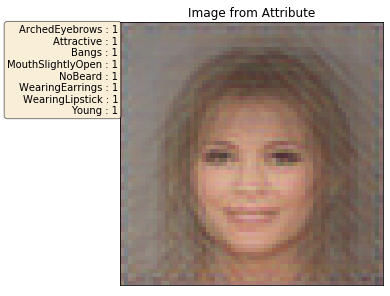

Epoch [6/200]...    ...349.253(s) feat_lo: 1.66753 - feat_med: 1.75629 - feat_hi: 2.00090 - attrib_rl: 0.35226 - KL img: 50.00471 - KL attrib: 49.99618 - ss: 11.31428
Epoch [7/200]...    ...349.193(s) feat_lo: 1.65461 - feat_med: 1.74496 - feat_hi: 1.98761 - attrib_rl: 0.34439 - KL img: 49.99547 - KL attrib: 50.00176 - ss: 11.31332
Epoch [8/200]...    ...349.115(s) feat_lo: 1.64389 - feat_med: 1.73543 - feat_hi: 1.97713 - attrib_rl: 0.33896 - KL img: 50.00134 - KL attrib: 50.00213 - ss: 11.31436
Epoch [9/200]...    ...349.147(s) feat_lo: 1.63491 - feat_med: 1.72783 - feat_hi: 1.96903 - attrib_rl: 0.33479 - KL img: 50.00232 - KL attrib: 49.99992 - ss: 11.31777
Epoch [10/200]...   ...349.060(s) feat_lo: 1.62651 - feat_med: 1.72071 - feat_hi: 1.96043 - attrib_rl: 0.33167 - KL img: 50.00045 - KL attrib: 50.00420 - ss: 11.31692


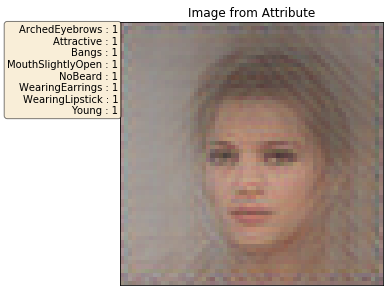

Epoch [11/200]...   ...349.540(s) feat_lo: 1.61829 - feat_med: 1.71376 - feat_hi: 1.95214 - attrib_rl: 0.32869 - KL img: 49.99877 - KL attrib: 49.99550 - ss: 11.31699
Epoch [12/200]...   ...349.533(s) feat_lo: 1.60901 - feat_med: 1.70481 - feat_hi: 1.93923 - attrib_rl: 0.32508 - KL img: 50.00080 - KL attrib: 50.00233 - ss: 11.31973
Epoch [13/200]...   ...349.239(s) feat_lo: 1.59886 - feat_med: 1.69469 - feat_hi: 1.92527 - attrib_rl: 0.32029 - KL img: 49.99926 - KL attrib: 49.99519 - ss: 11.32711
Epoch [14/200]...   ...349.223(s) feat_lo: 1.59220 - feat_med: 1.68831 - feat_hi: 1.91611 - attrib_rl: 0.31653 - KL img: 50.00051 - KL attrib: 50.00223 - ss: 11.32949
Epoch [15/200]...   ...349.105(s) feat_lo: 1.58706 - feat_med: 1.68336 - feat_hi: 1.90778 - attrib_rl: 0.31340 - KL img: 50.00005 - KL attrib: 50.00282 - ss: 11.33120


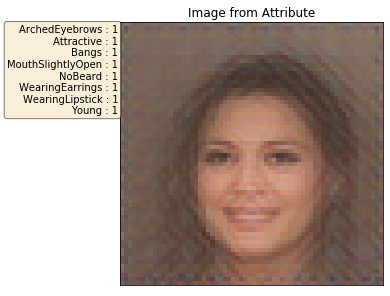

Epoch [16/200]...   ...349.116(s) feat_lo: 1.58225 - feat_med: 1.67880 - feat_hi: 1.89988 - attrib_rl: 0.31135 - KL img: 49.99858 - KL attrib: 49.99645 - ss: 11.33427
Epoch [17/200]...   ...349.121(s) feat_lo: 1.57760 - feat_med: 1.67446 - feat_hi: 1.89167 - attrib_rl: 0.30932 - KL img: 50.00257 - KL attrib: 50.00271 - ss: 11.33568
Epoch [18/200]...   ...349.083(s) feat_lo: 1.57408 - feat_med: 1.67099 - feat_hi: 1.88688 - attrib_rl: 0.30726 - KL img: 49.99908 - KL attrib: 49.99826 - ss: 11.33591
Epoch [19/200]...   ...349.064(s) feat_lo: 1.57149 - feat_med: 1.66862 - feat_hi: 1.88299 - attrib_rl: 0.30595 - KL img: 50.00123 - KL attrib: 50.00007 - ss: 11.33617
Epoch [20/200]...   ...349.064(s) feat_lo: 1.56863 - feat_med: 1.66597 - feat_hi: 1.87864 - attrib_rl: 0.30418 - KL img: 49.99944 - KL attrib: 49.99815 - ss: 11.33578


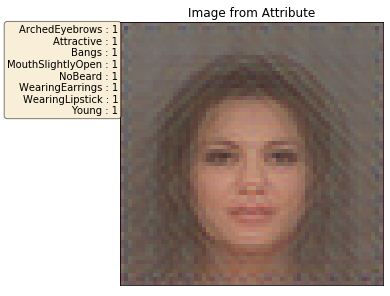

Epoch [21/200]...   ...349.263(s) feat_lo: 1.56669 - feat_med: 1.66406 - feat_hi: 1.87571 - attrib_rl: 0.30311 - KL img: 50.00032 - KL attrib: 50.00359 - ss: 11.33547
Epoch [22/200]...   ...349.111(s) feat_lo: 1.56462 - feat_med: 1.66238 - feat_hi: 1.87388 - attrib_rl: 0.30139 - KL img: 49.99991 - KL attrib: 50.00129 - ss: 11.33593
Epoch [23/200]...   ...348.917(s) feat_lo: 1.56248 - feat_med: 1.66016 - feat_hi: 1.87083 - attrib_rl: 0.30068 - KL img: 49.99897 - KL attrib: 49.99749 - ss: 11.33620
Epoch [24/200]...   ...349.052(s) feat_lo: 1.56101 - feat_med: 1.65898 - feat_hi: 1.86898 - attrib_rl: 0.29935 - KL img: 50.00174 - KL attrib: 49.99954 - ss: 11.33879
Epoch [25/200]...   ...348.996(s) feat_lo: 1.55899 - feat_med: 1.65711 - feat_hi: 1.86637 - attrib_rl: 0.29860 - KL img: 49.99964 - KL attrib: 50.00054 - ss: 11.33862


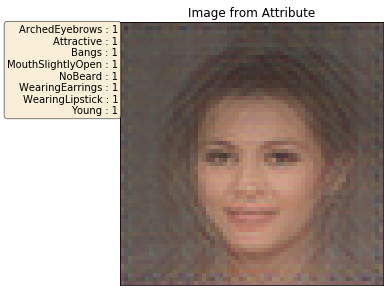

Epoch [26/200]...   ...349.069(s) feat_lo: 1.55790 - feat_med: 1.65618 - feat_hi: 1.86512 - attrib_rl: 0.29742 - KL img: 49.99839 - KL attrib: 50.00101 - ss: 11.33921
Epoch [27/200]...   ...349.076(s) feat_lo: 1.55674 - feat_med: 1.65503 - feat_hi: 1.86364 - attrib_rl: 0.29650 - KL img: 50.00260 - KL attrib: 49.99846 - ss: 11.34289
Epoch [28/200]...   ...349.041(s) feat_lo: 1.55492 - feat_med: 1.65353 - feat_hi: 1.86200 - attrib_rl: 0.29560 - KL img: 50.00037 - KL attrib: 50.00180 - ss: 11.34090
Epoch [29/200]...   ...349.084(s) feat_lo: 1.55388 - feat_med: 1.65253 - feat_hi: 1.86044 - attrib_rl: 0.29475 - KL img: 49.99937 - KL attrib: 49.99930 - ss: 11.34093
Epoch [30/200]...   ...349.168(s) feat_lo: 1.55228 - feat_med: 1.65123 - feat_hi: 1.85915 - attrib_rl: 0.29369 - KL img: 49.99866 - KL attrib: 49.99870 - ss: 11.34251


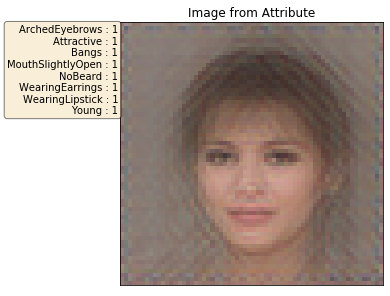

Epoch [31/200]...   ...349.143(s) feat_lo: 1.55110 - feat_med: 1.64995 - feat_hi: 1.85713 - attrib_rl: 0.29324 - KL img: 50.00161 - KL attrib: 50.00074 - ss: 11.34275
Epoch [32/200]...   ...349.020(s) feat_lo: 1.54959 - feat_med: 1.64855 - feat_hi: 1.85508 - attrib_rl: 0.29204 - KL img: 50.00057 - KL attrib: 50.00096 - ss: 11.34546
Epoch [33/200]...   ...348.999(s) feat_lo: 1.54872 - feat_med: 1.64773 - feat_hi: 1.85435 - attrib_rl: 0.29117 - KL img: 49.99988 - KL attrib: 49.99990 - ss: 11.34537
Epoch [34/200]...   ...349.049(s) feat_lo: 1.54762 - feat_med: 1.64657 - feat_hi: 1.85245 - attrib_rl: 0.29052 - KL img: 49.99916 - KL attrib: 49.99864 - ss: 11.34591
Epoch [35/200]...   ...349.250(s) feat_lo: 1.54653 - feat_med: 1.64565 - feat_hi: 1.85129 - attrib_rl: 0.28991 - KL img: 49.99981 - KL attrib: 50.00038 - ss: 11.34711


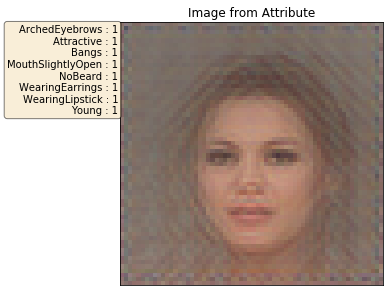

Epoch [36/200]...   ...349.224(s) feat_lo: 1.54565 - feat_med: 1.64485 - feat_hi: 1.85023 - attrib_rl: 0.28895 - KL img: 49.99989 - KL attrib: 50.00029 - ss: 11.34967
Epoch [37/200]...   ...349.153(s) feat_lo: 1.54484 - feat_med: 1.64400 - feat_hi: 1.84865 - attrib_rl: 0.28854 - KL img: 50.00139 - KL attrib: 49.99840 - ss: 11.35348
Epoch [38/200]...   ...349.439(s) feat_lo: 1.54353 - feat_med: 1.64282 - feat_hi: 1.84721 - attrib_rl: 0.28796 - KL img: 49.99953 - KL attrib: 50.00234 - ss: 11.35066
Epoch [39/200]...   ...349.427(s) feat_lo: 1.54293 - feat_med: 1.64220 - feat_hi: 1.84629 - attrib_rl: 0.28743 - KL img: 49.99857 - KL attrib: 49.99696 - ss: 11.35055
Epoch [40/200]...   ...349.302(s) feat_lo: 1.54129 - feat_med: 1.64067 - feat_hi: 1.84459 - attrib_rl: 0.28666 - KL img: 50.00099 - KL attrib: 50.00163 - ss: 11.35198


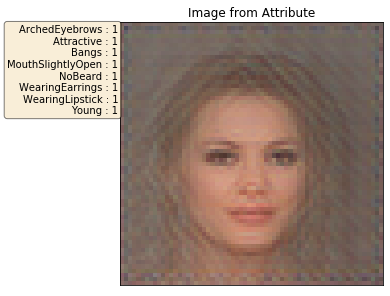

Epoch [41/200]...   ...349.254(s) feat_lo: 1.54112 - feat_med: 1.64056 - feat_hi: 1.84431 - attrib_rl: 0.28583 - KL img: 49.99953 - KL attrib: 49.99971 - ss: 11.35292
Epoch [42/200]...   ...349.269(s) feat_lo: 1.53989 - feat_med: 1.63950 - feat_hi: 1.84271 - attrib_rl: 0.28553 - KL img: 49.99979 - KL attrib: 50.00070 - ss: 11.35416
Epoch [43/200]...   ...349.288(s) feat_lo: 1.53899 - feat_med: 1.63857 - feat_hi: 1.84127 - attrib_rl: 0.28499 - KL img: 50.00016 - KL attrib: 49.99935 - ss: 11.35351
Epoch [44/200]...   ...349.456(s) feat_lo: 1.53783 - feat_med: 1.63744 - feat_hi: 1.83948 - attrib_rl: 0.28426 - KL img: 49.99977 - KL attrib: 50.00210 - ss: 11.35379
Epoch [45/200]...   ...349.185(s) feat_lo: 1.53666 - feat_med: 1.63639 - feat_hi: 1.83814 - attrib_rl: 0.28360 - KL img: 50.00060 - KL attrib: 49.99809 - ss: 11.35564


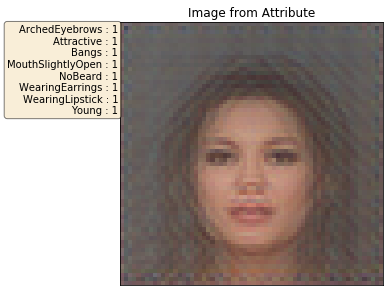

Epoch [46/200]...   ...349.006(s) feat_lo: 1.53554 - feat_med: 1.63535 - feat_hi: 1.83565 - attrib_rl: 0.28297 - KL img: 50.00060 - KL attrib: 50.00090 - ss: 11.35583
Epoch [47/200]...   ...349.054(s) feat_lo: 1.53471 - feat_med: 1.63458 - feat_hi: 1.83490 - attrib_rl: 0.28243 - KL img: 50.00040 - KL attrib: 50.00045 - ss: 11.35984
Epoch [48/200]...   ...349.092(s) feat_lo: 1.53390 - feat_med: 1.63366 - feat_hi: 1.83380 - attrib_rl: 0.28205 - KL img: 50.00004 - KL attrib: 49.99965 - ss: 11.36048
Epoch [49/200]...   ...349.091(s) feat_lo: 1.53300 - feat_med: 1.63300 - feat_hi: 1.83275 - attrib_rl: 0.28131 - KL img: 49.99968 - KL attrib: 49.99860 - ss: 11.35943
Epoch [50/200]...   ...348.985(s) feat_lo: 1.53210 - feat_med: 1.63216 - feat_hi: 1.83174 - attrib_rl: 0.28099 - KL img: 50.00029 - KL attrib: 50.00234 - ss: 11.36109


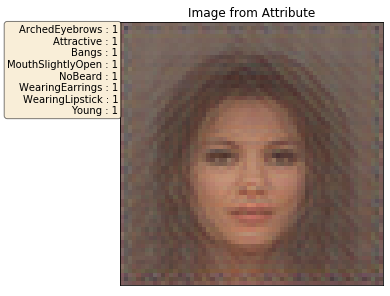

checkpointing at epoch: 50
Epoch [51/200]...   ...348.989(s) feat_lo: 1.53174 - feat_med: 1.63169 - feat_hi: 1.83122 - attrib_rl: 0.28056 - KL img: 49.99945 - KL attrib: 49.99817 - ss: 11.36089
Epoch [52/200]...   ...349.012(s) feat_lo: 1.53110 - feat_med: 1.63127 - feat_hi: 1.83112 - attrib_rl: 0.27982 - KL img: 49.99996 - KL attrib: 50.00100 - ss: 11.36093
Epoch [53/200]...   ...349.265(s) feat_lo: 1.53030 - feat_med: 1.63050 - feat_hi: 1.83010 - attrib_rl: 0.27928 - KL img: 50.00101 - KL attrib: 50.00035 - ss: 11.36026
Epoch [54/200]...   ...349.271(s) feat_lo: 1.52986 - feat_med: 1.63004 - feat_hi: 1.82977 - attrib_rl: 0.27902 - KL img: 50.00017 - KL attrib: 49.99963 - ss: 11.36329
Epoch [55/200]...   ...349.224(s) feat_lo: 1.52896 - feat_med: 1.62947 - feat_hi: 1.82929 - attrib_rl: 0.27867 - KL img: 49.99935 - KL attrib: 50.00000 - ss: 11.36243


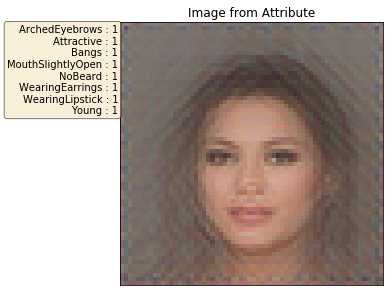

Epoch [56/200]...   ...349.254(s) feat_lo: 1.52843 - feat_med: 1.62877 - feat_hi: 1.82809 - attrib_rl: 0.27803 - KL img: 49.99982 - KL attrib: 49.99982 - ss: 11.36295
Epoch [57/200]...   ...349.280(s) feat_lo: 1.52790 - feat_med: 1.62818 - feat_hi: 1.82726 - attrib_rl: 0.27773 - KL img: 49.99928 - KL attrib: 49.99894 - ss: 11.36314
Epoch [58/200]...   ...349.287(s) feat_lo: 1.52763 - feat_med: 1.62811 - feat_hi: 1.82771 - attrib_rl: 0.27730 - KL img: 50.00257 - KL attrib: 50.00199 - ss: 11.36441
Epoch [59/200]...   ...349.283(s) feat_lo: 1.52680 - feat_med: 1.62738 - feat_hi: 1.82658 - attrib_rl: 0.27688 - KL img: 49.99837 - KL attrib: 50.00054 - ss: 11.36340
Epoch [60/200]...   ...349.146(s) feat_lo: 1.52627 - feat_med: 1.62686 - feat_hi: 1.82555 - attrib_rl: 0.27664 - KL img: 49.99946 - KL attrib: 49.99884 - ss: 11.36486


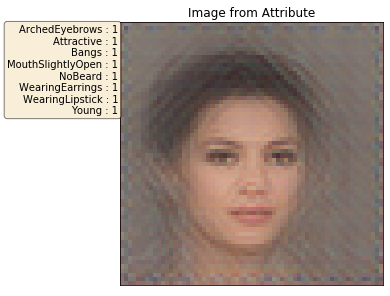

Epoch [61/200]...   ...349.150(s) feat_lo: 1.52585 - feat_med: 1.62657 - feat_hi: 1.82595 - attrib_rl: 0.27599 - KL img: 50.00072 - KL attrib: 49.99884 - ss: 11.36447
Epoch [62/200]...   ...349.211(s) feat_lo: 1.52478 - feat_med: 1.62554 - feat_hi: 1.82394 - attrib_rl: 0.27590 - KL img: 50.00020 - KL attrib: 50.00105 - ss: 11.36507
Epoch [63/200]...   ...349.251(s) feat_lo: 1.52503 - feat_med: 1.62576 - feat_hi: 1.82447 - attrib_rl: 0.27545 - KL img: 49.99937 - KL attrib: 49.99977 - ss: 11.36339
Epoch [64/200]...   ...349.274(s) feat_lo: 1.52413 - feat_med: 1.62475 - feat_hi: 1.82238 - attrib_rl: 0.27530 - KL img: 50.00088 - KL attrib: 50.00133 - ss: 11.36693
Epoch [65/200]...   ...349.459(s) feat_lo: 1.52422 - feat_med: 1.62497 - feat_hi: 1.82357 - attrib_rl: 0.27471 - KL img: 49.99938 - KL attrib: 50.00055 - ss: 11.36543


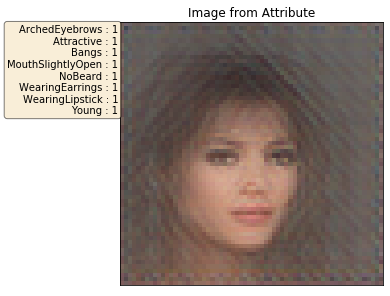

Epoch [66/200]...   ...349.216(s) feat_lo: 1.52357 - feat_med: 1.62437 - feat_hi: 1.82220 - attrib_rl: 0.27435 - KL img: 50.00041 - KL attrib: 49.99847 - ss: 11.36657
Epoch [67/200]...   ...349.104(s) feat_lo: 1.52319 - feat_med: 1.62406 - feat_hi: 1.82161 - attrib_rl: 0.27393 - KL img: 49.99969 - KL attrib: 49.99869 - ss: 11.36603
Epoch [68/200]...   ...349.166(s) feat_lo: 1.52266 - feat_med: 1.62350 - feat_hi: 1.82151 - attrib_rl: 0.27382 - KL img: 50.00138 - KL attrib: 50.00166 - ss: 11.36766
Epoch [69/200]...   ...349.127(s) feat_lo: 1.52207 - feat_med: 1.62298 - feat_hi: 1.82079 - attrib_rl: 0.27337 - KL img: 49.99914 - KL attrib: 49.99948 - ss: 11.36583
Epoch [70/200]...   ...349.256(s) feat_lo: 1.52244 - feat_med: 1.62327 - feat_hi: 1.82065 - attrib_rl: 0.27337 - KL img: 49.99991 - KL attrib: 50.00076 - ss: 11.36920


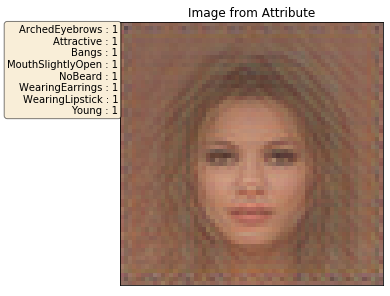

Epoch [71/200]...   ...349.372(s) feat_lo: 1.52128 - feat_med: 1.62214 - feat_hi: 1.81946 - attrib_rl: 0.27312 - KL img: 49.99888 - KL attrib: 49.99871 - ss: 11.37018
Epoch [72/200]...   ...349.344(s) feat_lo: 1.52104 - feat_med: 1.62203 - feat_hi: 1.81932 - attrib_rl: 0.27257 - KL img: 50.00139 - KL attrib: 50.00047 - ss: 11.36758
Epoch [73/200]...   ...349.208(s) feat_lo: 1.52066 - feat_med: 1.62171 - feat_hi: 1.81883 - attrib_rl: 0.27226 - KL img: 49.99966 - KL attrib: 50.00072 - ss: 11.36956
Epoch [74/200]...   ...349.047(s) feat_lo: 1.52007 - feat_med: 1.62104 - feat_hi: 1.81777 - attrib_rl: 0.27166 - KL img: 50.00082 - KL attrib: 49.99924 - ss: 11.37145
Epoch [75/200]...   ...349.086(s) feat_lo: 1.51999 - feat_med: 1.62105 - feat_hi: 1.81729 - attrib_rl: 0.27174 - KL img: 49.99960 - KL attrib: 50.00008 - ss: 11.36952


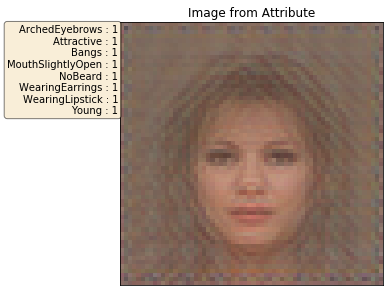

Epoch [76/200]...   ...349.127(s) feat_lo: 1.51985 - feat_med: 1.62100 - feat_hi: 1.81769 - attrib_rl: 0.27122 - KL img: 49.99947 - KL attrib: 50.00199 - ss: 11.37303
Epoch [77/200]...   ...349.154(s) feat_lo: 1.51956 - feat_med: 1.62075 - feat_hi: 1.81730 - attrib_rl: 0.27124 - KL img: 49.99962 - KL attrib: 50.00013 - ss: 11.37069
Epoch [78/200]...   ...349.079(s) feat_lo: 1.51875 - feat_med: 1.61994 - feat_hi: 1.81574 - attrib_rl: 0.27074 - KL img: 50.00104 - KL attrib: 49.99816 - ss: 11.36730
Epoch [79/200]...   ...349.072(s) feat_lo: 1.51897 - feat_med: 1.62014 - feat_hi: 1.81647 - attrib_rl: 0.27039 - KL img: 50.00041 - KL attrib: 50.00146 - ss: 11.37302
Epoch [80/200]...   ...349.070(s) feat_lo: 1.51845 - feat_med: 1.61965 - feat_hi: 1.81541 - attrib_rl: 0.26972 - KL img: 49.99843 - KL attrib: 49.99872 - ss: 11.37262


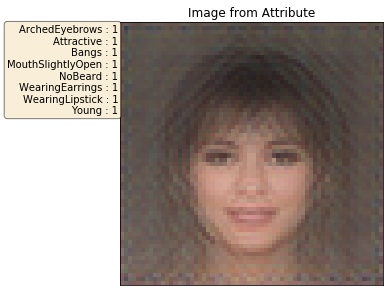

Epoch [81/200]...   ...349.098(s) feat_lo: 1.51837 - feat_med: 1.61971 - feat_hi: 1.81595 - attrib_rl: 0.26988 - KL img: 50.00085 - KL attrib: 50.00082 - ss: 11.36958
Epoch [82/200]...   ...349.058(s) feat_lo: 1.51770 - feat_med: 1.61889 - feat_hi: 1.81459 - attrib_rl: 0.27006 - KL img: 50.00055 - KL attrib: 49.99964 - ss: 11.37070
Epoch [83/200]...   ...349.162(s) feat_lo: 1.51761 - feat_med: 1.61888 - feat_hi: 1.81496 - attrib_rl: 0.26957 - KL img: 49.99854 - KL attrib: 49.99966 - ss: 11.37062
Epoch [84/200]...   ...349.215(s) feat_lo: 1.51732 - feat_med: 1.61879 - feat_hi: 1.81441 - attrib_rl: 0.26908 - KL img: 50.00127 - KL attrib: 49.99893 - ss: 11.37387
Epoch [85/200]...   ...349.131(s) feat_lo: 1.51691 - feat_med: 1.61828 - feat_hi: 1.81351 - attrib_rl: 0.26910 - KL img: 49.99935 - KL attrib: 50.00034 - ss: 11.37097


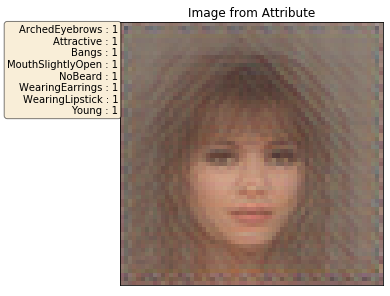

Epoch [86/200]...   ...349.149(s) feat_lo: 1.51680 - feat_med: 1.61816 - feat_hi: 1.81348 - attrib_rl: 0.26858 - KL img: 50.00015 - KL attrib: 50.00049 - ss: 11.37431
Epoch [87/200]...   ...349.277(s) feat_lo: 1.51643 - feat_med: 1.61772 - feat_hi: 1.81261 - attrib_rl: 0.26871 - KL img: 49.99985 - KL attrib: 49.99972 - ss: 11.37504
Epoch [88/200]...   ...349.325(s) feat_lo: 1.51580 - feat_med: 1.61723 - feat_hi: 1.81180 - attrib_rl: 0.26807 - KL img: 50.00063 - KL attrib: 50.00083 - ss: 11.37239
Epoch [89/200]...   ...349.313(s) feat_lo: 1.51556 - feat_med: 1.61702 - feat_hi: 1.81184 - attrib_rl: 0.26791 - KL img: 49.99983 - KL attrib: 49.99858 - ss: 11.37556
Epoch [90/200]...   ...351.006(s) feat_lo: 1.51550 - feat_med: 1.61690 - feat_hi: 1.81165 - attrib_rl: 0.26784 - KL img: 49.99949 - KL attrib: 50.00035 - ss: 11.37233


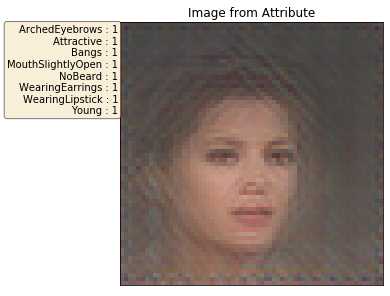

Epoch [91/200]...   ...352.079(s) feat_lo: 1.51525 - feat_med: 1.61670 - feat_hi: 1.81144 - attrib_rl: 0.26753 - KL img: 49.99989 - KL attrib: 50.00114 - ss: 11.37480
Epoch [92/200]...   ...352.189(s) feat_lo: 1.51526 - feat_med: 1.61682 - feat_hi: 1.81151 - attrib_rl: 0.26690 - KL img: 50.00010 - KL attrib: 49.99935 - ss: 11.37592
Epoch [93/200]...   ...352.271(s) feat_lo: 1.51455 - feat_med: 1.61611 - feat_hi: 1.81069 - attrib_rl: 0.26701 - KL img: 50.00044 - KL attrib: 49.99969 - ss: 11.37485
Epoch [94/200]...   ...352.352(s) feat_lo: 1.51464 - feat_med: 1.61606 - feat_hi: 1.81027 - attrib_rl: 0.26675 - KL img: 50.00052 - KL attrib: 50.00009 - ss: 11.37424
Epoch [95/200]...   ...349.645(s) feat_lo: 1.51397 - feat_med: 1.61549 - feat_hi: 1.81002 - attrib_rl: 0.26655 - KL img: 49.99854 - KL attrib: 49.99972 - ss: 11.37656


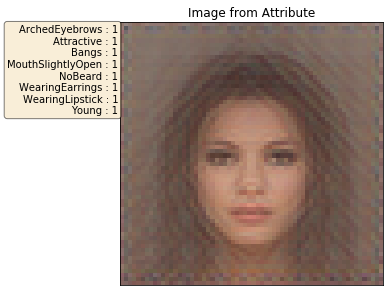

Epoch [96/200]...   ...349.679(s) feat_lo: 1.51374 - feat_med: 1.61526 - feat_hi: 1.80935 - attrib_rl: 0.26633 - KL img: 50.00131 - KL attrib: 50.00060 - ss: 11.37668
Epoch [97/200]...   ...349.407(s) feat_lo: 1.51381 - feat_med: 1.61546 - feat_hi: 1.80965 - attrib_rl: 0.26628 - KL img: 50.00002 - KL attrib: 49.99844 - ss: 11.37612
Epoch [98/200]...   ...349.246(s) feat_lo: 1.51346 - feat_med: 1.61484 - feat_hi: 1.80840 - attrib_rl: 0.26587 - KL img: 49.99916 - KL attrib: 50.00127 - ss: 11.37720
Epoch [99/200]...   ...349.237(s) feat_lo: 1.51288 - feat_med: 1.61438 - feat_hi: 1.80814 - attrib_rl: 0.26566 - KL img: 50.00036 - KL attrib: 50.00005 - ss: 11.37791
Epoch [100/200]...  ...349.257(s) feat_lo: 1.51311 - feat_med: 1.61473 - feat_hi: 1.80874 - attrib_rl: 0.26558 - KL img: 49.99965 - KL attrib: 50.00128 - ss: 11.37842


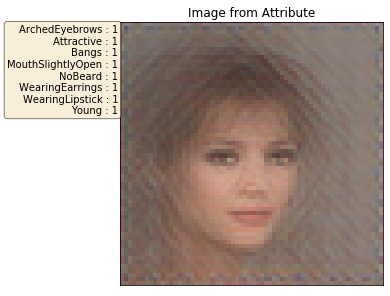

checkpointing at epoch: 100
Epoch [101/200]...  ...349.330(s) feat_lo: 1.51253 - feat_med: 1.61404 - feat_hi: 1.80796 - attrib_rl: 0.26531 - KL img: 50.00110 - KL attrib: 49.99827 - ss: 11.37827
Epoch [102/200]...  ...349.223(s) feat_lo: 1.51261 - feat_med: 1.61431 - feat_hi: 1.80761 - attrib_rl: 0.26493 - KL img: 49.99952 - KL attrib: 50.00177 - ss: 11.38112
Epoch [103/200]...  ...349.396(s) feat_lo: 1.51182 - feat_med: 1.61342 - feat_hi: 1.80675 - attrib_rl: 0.26459 - KL img: 50.00000 - KL attrib: 49.99960 - ss: 11.37977
Epoch [104/200]...  ...349.635(s) feat_lo: 1.51153 - feat_med: 1.61318 - feat_hi: 1.80596 - attrib_rl: 0.26454 - KL img: 50.00040 - KL attrib: 50.00024 - ss: 11.38007
Epoch [105/200]...  ...349.186(s) feat_lo: 1.51183 - feat_med: 1.61346 - feat_hi: 1.80656 - attrib_rl: 0.26447 - KL img: 49.99932 - KL attrib: 49.99865 - ss: 11.37712


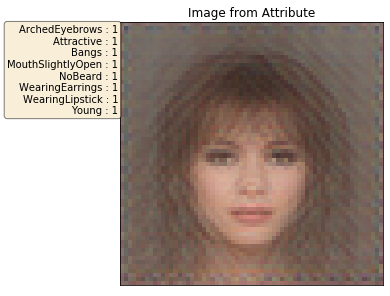

Epoch [106/200]...  ...349.336(s) feat_lo: 1.51135 - feat_med: 1.61301 - feat_hi: 1.80623 - attrib_rl: 0.26417 - KL img: 49.99885 - KL attrib: 50.00052 - ss: 11.37884
Epoch [107/200]...  ...349.173(s) feat_lo: 1.51077 - feat_med: 1.61251 - feat_hi: 1.80535 - attrib_rl: 0.26414 - KL img: 50.00227 - KL attrib: 50.00020 - ss: 11.37871
Epoch [108/200]...  ...349.338(s) feat_lo: 1.51043 - feat_med: 1.61204 - feat_hi: 1.80476 - attrib_rl: 0.26413 - KL img: 49.99944 - KL attrib: 49.99935 - ss: 11.38044
Epoch [109/200]...  ...349.226(s) feat_lo: 1.51078 - feat_med: 1.61239 - feat_hi: 1.80504 - attrib_rl: 0.26376 - KL img: 49.99880 - KL attrib: 50.00055 - ss: 11.38292
Epoch [110/200]...  ...349.099(s) feat_lo: 1.51019 - feat_med: 1.61195 - feat_hi: 1.80480 - attrib_rl: 0.26331 - KL img: 50.00109 - KL attrib: 49.99981 - ss: 11.38307


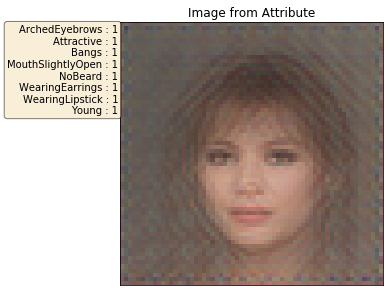

Epoch [111/200]...  ...349.140(s) feat_lo: 1.51020 - feat_med: 1.61190 - feat_hi: 1.80494 - attrib_rl: 0.26306 - KL img: 50.00033 - KL attrib: 50.00057 - ss: 11.38194
Epoch [112/200]...  ...349.149(s) feat_lo: 1.50966 - feat_med: 1.61141 - feat_hi: 1.80386 - attrib_rl: 0.26274 - KL img: 49.99901 - KL attrib: 49.99900 - ss: 11.38180
Epoch [113/200]...  ...349.098(s) feat_lo: 1.50951 - feat_med: 1.61121 - feat_hi: 1.80359 - attrib_rl: 0.26273 - KL img: 50.00050 - KL attrib: 50.00189 - ss: 11.38043
Epoch [114/200]...  ...349.040(s) feat_lo: 1.50937 - feat_med: 1.61112 - feat_hi: 1.80317 - attrib_rl: 0.26247 - KL img: 49.99996 - KL attrib: 49.99903 - ss: 11.37958
Epoch [115/200]...  ...349.065(s) feat_lo: 1.50901 - feat_med: 1.61077 - feat_hi: 1.80343 - attrib_rl: 0.26244 - KL img: 49.99915 - KL attrib: 50.00100 - ss: 11.37938


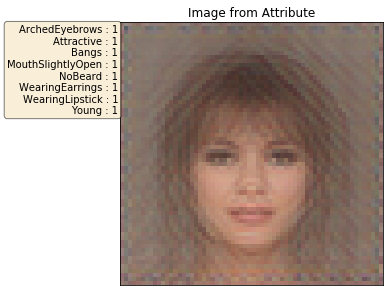

Epoch [116/200]...  ...349.155(s) feat_lo: 1.50890 - feat_med: 1.61061 - feat_hi: 1.80287 - attrib_rl: 0.26225 - KL img: 50.00118 - KL attrib: 49.99939 - ss: 11.38055
Epoch [117/200]...  ...349.236(s) feat_lo: 1.50853 - feat_med: 1.61019 - feat_hi: 1.80237 - attrib_rl: 0.26181 - KL img: 49.99958 - KL attrib: 49.99907 - ss: 11.38265
Epoch [118/200]...  ...349.385(s) feat_lo: 1.50862 - feat_med: 1.61039 - feat_hi: 1.80252 - attrib_rl: 0.26156 - KL img: 50.00088 - KL attrib: 50.00038 - ss: 11.38223
Epoch [119/200]...  ...349.144(s) feat_lo: 1.50804 - feat_med: 1.60986 - feat_hi: 1.80184 - attrib_rl: 0.26145 - KL img: 49.99993 - KL attrib: 50.00034 - ss: 11.38112
Epoch [120/200]...  ...349.211(s) feat_lo: 1.50841 - feat_med: 1.61028 - feat_hi: 1.80260 - attrib_rl: 0.26123 - KL img: 50.00025 - KL attrib: 49.99943 - ss: 11.38294


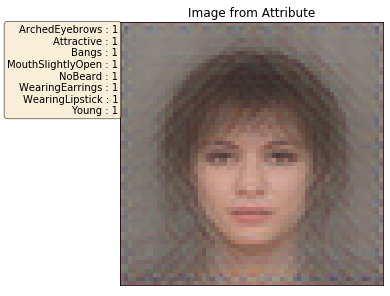

Epoch [121/200]...  ...349.208(s) feat_lo: 1.50816 - feat_med: 1.60998 - feat_hi: 1.80243 - attrib_rl: 0.26120 - KL img: 49.99829 - KL attrib: 50.00035 - ss: 11.38317
Epoch [122/200]...  ...348.971(s) feat_lo: 1.50778 - feat_med: 1.60974 - feat_hi: 1.80178 - attrib_rl: 0.26084 - KL img: 49.99986 - KL attrib: 49.99982 - ss: 11.38422
Epoch [123/200]...  ...349.009(s) feat_lo: 1.50745 - feat_med: 1.60928 - feat_hi: 1.80099 - attrib_rl: 0.26039 - KL img: 50.00103 - KL attrib: 50.00007 - ss: 11.38205
Epoch [124/200]...  ...348.969(s) feat_lo: 1.50763 - feat_med: 1.60944 - feat_hi: 1.80128 - attrib_rl: 0.26059 - KL img: 50.00014 - KL attrib: 49.99993 - ss: 11.38505
Epoch [125/200]...  ...349.376(s) feat_lo: 1.50726 - feat_med: 1.60925 - feat_hi: 1.80132 - attrib_rl: 0.26036 - KL img: 49.99997 - KL attrib: 50.00225 - ss: 11.38650


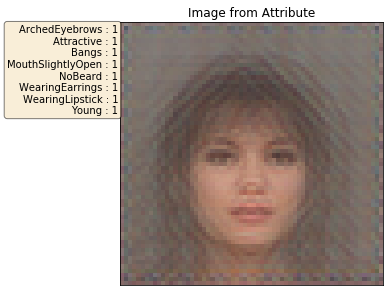

Epoch [126/200]...  ...349.064(s) feat_lo: 1.50698 - feat_med: 1.60890 - feat_hi: 1.80094 - attrib_rl: 0.26018 - KL img: 49.99940 - KL attrib: 49.99775 - ss: 11.38544
Epoch [127/200]...  ...349.081(s) feat_lo: 1.50690 - feat_med: 1.60879 - feat_hi: 1.80060 - attrib_rl: 0.25992 - KL img: 50.00013 - KL attrib: 50.00063 - ss: 11.38245
Epoch [128/200]...  ...349.107(s) feat_lo: 1.50659 - feat_med: 1.60852 - feat_hi: 1.80038 - attrib_rl: 0.25998 - KL img: 49.99990 - KL attrib: 49.99907 - ss: 11.38569
Epoch [129/200]...  ...349.131(s) feat_lo: 1.50615 - feat_med: 1.60812 - feat_hi: 1.79980 - attrib_rl: 0.25972 - KL img: 50.00041 - KL attrib: 49.99997 - ss: 11.38523
Epoch [130/200]...  ...349.280(s) feat_lo: 1.50653 - feat_med: 1.60855 - feat_hi: 1.80017 - attrib_rl: 0.25980 - KL img: 50.00000 - KL attrib: 49.99965 - ss: 11.38336


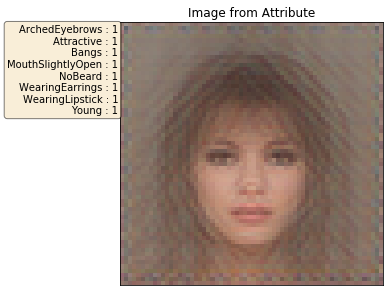

Epoch [131/200]...  ...349.376(s) feat_lo: 1.50648 - feat_med: 1.60837 - feat_hi: 1.79992 - attrib_rl: 0.25951 - KL img: 49.99933 - KL attrib: 50.00108 - ss: 11.38496
Epoch [132/200]...  ...349.323(s) feat_lo: 1.50575 - feat_med: 1.60752 - feat_hi: 1.79885 - attrib_rl: 0.25919 - KL img: 49.99954 - KL attrib: 50.00068 - ss: 11.38585
Epoch [133/200]...  ...349.383(s) feat_lo: 1.50600 - feat_med: 1.60784 - feat_hi: 1.79955 - attrib_rl: 0.25902 - KL img: 50.00073 - KL attrib: 49.99904 - ss: 11.38504
Epoch [134/200]...  ...349.311(s) feat_lo: 1.50572 - feat_med: 1.60774 - feat_hi: 1.79904 - attrib_rl: 0.25898 - KL img: 50.00100 - KL attrib: 49.99976 - ss: 11.38613
Epoch [135/200]...  ...349.461(s) feat_lo: 1.50532 - feat_med: 1.60729 - feat_hi: 1.79888 - attrib_rl: 0.25889 - KL img: 50.00007 - KL attrib: 50.00072 - ss: 11.38313


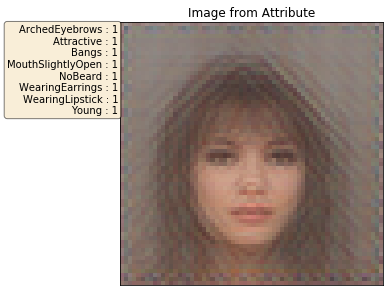

Epoch [136/200]...  ...349.147(s) feat_lo: 1.50534 - feat_med: 1.60722 - feat_hi: 1.79839 - attrib_rl: 0.25870 - KL img: 49.99909 - KL attrib: 49.99982 - ss: 11.38462
Epoch [137/200]...  ...348.956(s) feat_lo: 1.50519 - feat_med: 1.60717 - feat_hi: 1.79844 - attrib_rl: 0.25848 - KL img: 50.00095 - KL attrib: 49.99895 - ss: 11.38810
Epoch [138/200]...  ...349.126(s) feat_lo: 1.50502 - feat_med: 1.60694 - feat_hi: 1.79775 - attrib_rl: 0.25867 - KL img: 49.99971 - KL attrib: 50.00134 - ss: 11.38820
Epoch [139/200]...  ...349.023(s) feat_lo: 1.50443 - feat_med: 1.60651 - feat_hi: 1.79755 - attrib_rl: 0.25836 - KL img: 49.99870 - KL attrib: 49.99989 - ss: 11.38811
Epoch [140/200]...  ...349.037(s) feat_lo: 1.50524 - feat_med: 1.60720 - feat_hi: 1.79821 - attrib_rl: 0.25826 - KL img: 50.00191 - KL attrib: 49.99940 - ss: 11.38823


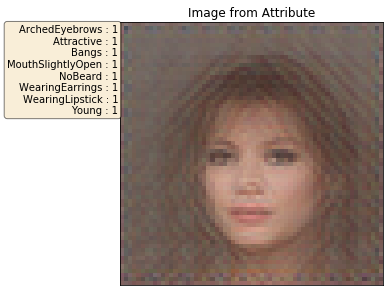

Epoch [141/200]...  ...349.397(s) feat_lo: 1.50454 - feat_med: 1.60642 - feat_hi: 1.79695 - attrib_rl: 0.25805 - KL img: 49.99973 - KL attrib: 50.00044 - ss: 11.38825
Epoch [142/200]...  ...349.315(s) feat_lo: 1.50423 - feat_med: 1.60612 - feat_hi: 1.79658 - attrib_rl: 0.25779 - KL img: 49.99947 - KL attrib: 49.99993 - ss: 11.38622
Epoch [143/200]...  ...349.292(s) feat_lo: 1.50363 - feat_med: 1.60575 - feat_hi: 1.79592 - attrib_rl: 0.25740 - KL img: 50.00052 - KL attrib: 49.99953 - ss: 11.38705
Epoch [144/200]...  ...349.263(s) feat_lo: 1.50382 - feat_med: 1.60582 - feat_hi: 1.79586 - attrib_rl: 0.25722 - KL img: 49.99956 - KL attrib: 50.00080 - ss: 11.38759
Epoch [145/200]...  ...349.224(s) feat_lo: 1.50361 - feat_med: 1.60555 - feat_hi: 1.79569 - attrib_rl: 0.25702 - KL img: 49.99950 - KL attrib: 49.99891 - ss: 11.38903


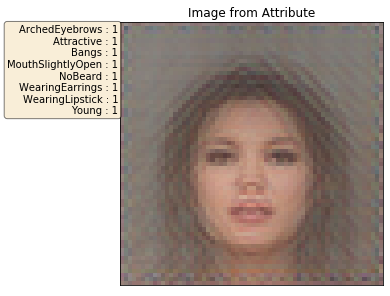

Epoch [146/200]...  ...350.005(s) feat_lo: 1.50367 - feat_med: 1.60571 - feat_hi: 1.79570 - attrib_rl: 0.25744 - KL img: 49.99990 - KL attrib: 50.00067 - ss: 11.38883
Epoch [147/200]...  ...347.988(s) feat_lo: 1.50288 - feat_med: 1.60475 - feat_hi: 1.79435 - attrib_rl: 0.25691 - KL img: 50.00054 - KL attrib: 49.99943 - ss: 11.38788
Epoch [148/200]...  ...349.868(s) feat_lo: 1.50271 - feat_med: 1.60473 - feat_hi: 1.79433 - attrib_rl: 0.25692 - KL img: 50.00056 - KL attrib: 50.00041 - ss: 11.38756
Epoch [149/200]...  ...350.307(s) feat_lo: 1.50237 - feat_med: 1.60452 - feat_hi: 1.79367 - attrib_rl: 0.25690 - KL img: 49.99935 - KL attrib: 50.00041 - ss: 11.38911
Epoch [150/200]...  ...350.093(s) feat_lo: 1.50274 - feat_med: 1.60479 - feat_hi: 1.79426 - attrib_rl: 0.25669 - KL img: 49.99948 - KL attrib: 49.99970 - ss: 11.38949


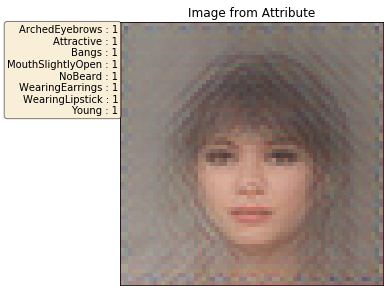

checkpointing at epoch: 150
Epoch [151/200]...  ...349.866(s) feat_lo: 1.50257 - feat_med: 1.60446 - feat_hi: 1.79377 - attrib_rl: 0.25634 - KL img: 50.00055 - KL attrib: 49.99970 - ss: 11.39101
Epoch [152/200]...  ...349.731(s) feat_lo: 1.50235 - feat_med: 1.60436 - feat_hi: 1.79375 - attrib_rl: 0.25660 - KL img: 49.99977 - KL attrib: 50.00028 - ss: 11.38866
Epoch [153/200]...  ...349.520(s) feat_lo: 1.50233 - feat_med: 1.60444 - feat_hi: 1.79369 - attrib_rl: 0.25624 - KL img: 50.00031 - KL attrib: 49.99959 - ss: 11.39042
Epoch [154/200]...  ...349.445(s) feat_lo: 1.50228 - feat_med: 1.60419 - feat_hi: 1.79333 - attrib_rl: 0.25613 - KL img: 49.99988 - KL attrib: 50.00076 - ss: 11.38925
Epoch [155/200]...  ...349.466(s) feat_lo: 1.50191 - feat_med: 1.60408 - feat_hi: 1.79292 - attrib_rl: 0.25592 - KL img: 50.00108 - KL attrib: 49.99950 - ss: 11.39045


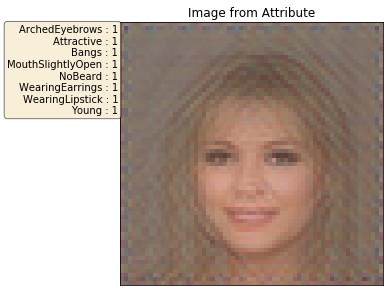

Epoch [156/200]...  ...349.440(s) feat_lo: 1.50180 - feat_med: 1.60370 - feat_hi: 1.79243 - attrib_rl: 0.25598 - KL img: 49.99752 - KL attrib: 49.99971 - ss: 11.39108
Epoch [157/200]...  ...349.509(s) feat_lo: 1.50169 - feat_med: 1.60368 - feat_hi: 1.79243 - attrib_rl: 0.25547 - KL img: 50.00197 - KL attrib: 50.00000 - ss: 11.39048
Epoch [158/200]...  ...349.446(s) feat_lo: 1.50175 - feat_med: 1.60388 - feat_hi: 1.79259 - attrib_rl: 0.25600 - KL img: 49.99947 - KL attrib: 50.00079 - ss: 11.39281
Epoch [159/200]...  ...349.478(s) feat_lo: 1.50115 - feat_med: 1.60324 - feat_hi: 1.79181 - attrib_rl: 0.25560 - KL img: 50.00055 - KL attrib: 49.99981 - ss: 11.39223
Epoch [160/200]...  ...349.497(s) feat_lo: 1.50158 - feat_med: 1.60357 - feat_hi: 1.79226 - attrib_rl: 0.25535 - KL img: 49.99979 - KL attrib: 49.99962 - ss: 11.39200


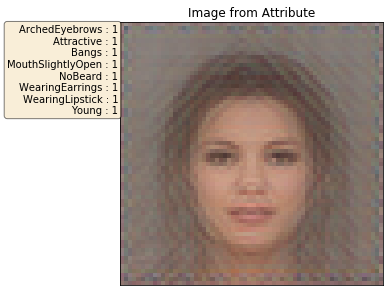

Epoch [161/200]...  ...349.524(s) feat_lo: 1.50133 - feat_med: 1.60329 - feat_hi: 1.79168 - attrib_rl: 0.25510 - KL img: 50.00091 - KL attrib: 50.00021 - ss: 11.39039
Epoch [162/200]...  ...349.489(s) feat_lo: 1.50094 - feat_med: 1.60297 - feat_hi: 1.79153 - attrib_rl: 0.25491 - KL img: 49.99926 - KL attrib: 49.99964 - ss: 11.39285
Epoch [163/200]...  ...344.669(s) feat_lo: 1.50116 - feat_med: 1.60305 - feat_hi: 1.79140 - attrib_rl: 0.25516 - KL img: 50.00053 - KL attrib: 50.00010 - ss: 11.39345
Epoch [164/200]...  ...348.828(s) feat_lo: 1.50094 - feat_med: 1.60297 - feat_hi: 1.79166 - attrib_rl: 0.25459 - KL img: 49.99874 - KL attrib: 50.00044 - ss: 11.39252
Epoch [165/200]...  ...349.852(s) feat_lo: 1.50034 - feat_med: 1.60249 - feat_hi: 1.79074 - attrib_rl: 0.25474 - KL img: 49.99991 - KL attrib: 49.99917 - ss: 11.39188


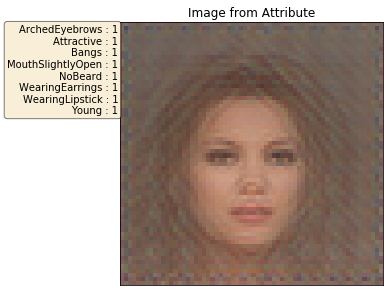

Epoch [166/200]...  ...349.691(s) feat_lo: 1.50053 - feat_med: 1.60261 - feat_hi: 1.79082 - attrib_rl: 0.25505 - KL img: 50.00061 - KL attrib: 50.00129 - ss: 11.39261
Epoch [167/200]...  ...349.477(s) feat_lo: 1.50037 - feat_med: 1.60249 - feat_hi: 1.79084 - attrib_rl: 0.25454 - KL img: 50.00070 - KL attrib: 50.00049 - ss: 11.39391
Epoch [168/200]...  ...349.769(s) feat_lo: 1.50020 - feat_med: 1.60228 - feat_hi: 1.79047 - attrib_rl: 0.25445 - KL img: 49.99945 - KL attrib: 49.99826 - ss: 11.39165
Epoch [169/200]...  ...349.485(s) feat_lo: 1.50026 - feat_med: 1.60229 - feat_hi: 1.79019 - attrib_rl: 0.25459 - KL img: 50.00030 - KL attrib: 50.00038 - ss: 11.39137
Epoch [170/200]...  ...349.417(s) feat_lo: 1.50021 - feat_med: 1.60212 - feat_hi: 1.79007 - attrib_rl: 0.25456 - KL img: 50.00014 - KL attrib: 50.00030 - ss: 11.39671


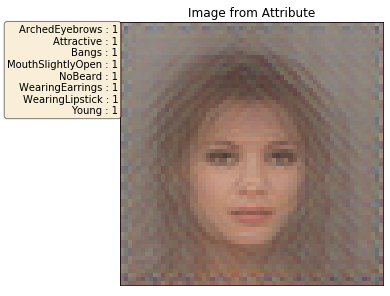

Epoch [171/200]...  ...349.628(s) feat_lo: 1.49984 - feat_med: 1.60191 - feat_hi: 1.78995 - attrib_rl: 0.25425 - KL img: 49.99951 - KL attrib: 50.00151 - ss: 11.39403
Epoch [172/200]...  ...349.516(s) feat_lo: 1.49989 - feat_med: 1.60200 - feat_hi: 1.79019 - attrib_rl: 0.25424 - KL img: 49.99953 - KL attrib: 49.99849 - ss: 11.39495
Epoch [173/200]...  ...349.565(s) feat_lo: 1.49974 - feat_med: 1.60171 - feat_hi: 1.78942 - attrib_rl: 0.25423 - KL img: 50.00079 - KL attrib: 50.00108 - ss: 11.39304
Epoch [174/200]...  ...349.422(s) feat_lo: 1.49947 - feat_med: 1.60157 - feat_hi: 1.78954 - attrib_rl: 0.25397 - KL img: 49.99947 - KL attrib: 49.99996 - ss: 11.39458
Epoch [175/200]...  ...349.510(s) feat_lo: 1.49964 - feat_med: 1.60168 - feat_hi: 1.78985 - attrib_rl: 0.25392 - KL img: 50.00091 - KL attrib: 49.99936 - ss: 11.39478


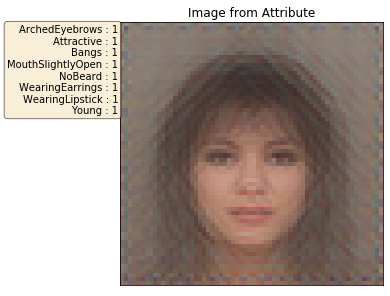

Epoch [176/200]...  ...349.395(s) feat_lo: 1.49929 - feat_med: 1.60149 - feat_hi: 1.78935 - attrib_rl: 0.25344 - KL img: 49.99956 - KL attrib: 49.99920 - ss: 11.39332
Epoch [177/200]...  ...349.567(s) feat_lo: 1.49917 - feat_med: 1.60140 - feat_hi: 1.78946 - attrib_rl: 0.25346 - KL img: 50.00022 - KL attrib: 50.00366 - ss: 11.39261
Epoch [178/200]...  ...349.993(s) feat_lo: 1.49916 - feat_med: 1.60135 - feat_hi: 1.78923 - attrib_rl: 0.25338 - KL img: 50.00042 - KL attrib: 49.99729 - ss: 11.39579
Epoch [179/200]...  ...349.311(s) feat_lo: 1.49921 - feat_med: 1.60133 - feat_hi: 1.78913 - attrib_rl: 0.25321 - KL img: 49.99951 - KL attrib: 49.99936 - ss: 11.39490
Epoch [180/200]...  ...348.971(s) feat_lo: 1.49931 - feat_med: 1.60145 - feat_hi: 1.78910 - attrib_rl: 0.25312 - KL img: 49.99874 - KL attrib: 50.00002 - ss: 11.39500


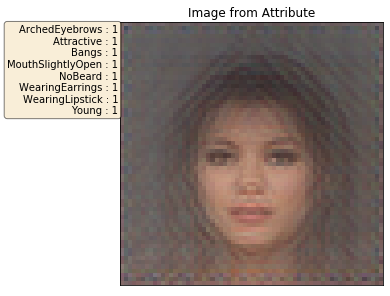

Epoch [181/200]...  ...349.405(s) feat_lo: 1.49901 - feat_med: 1.60130 - feat_hi: 1.78945 - attrib_rl: 0.25320 - KL img: 50.00109 - KL attrib: 50.00014 - ss: 11.39545
Epoch [182/200]...  ...349.089(s) feat_lo: 1.49869 - feat_med: 1.60085 - feat_hi: 1.78848 - attrib_rl: 0.25317 - KL img: 50.00023 - KL attrib: 49.99920 - ss: 11.39450
Epoch [183/200]...  ...348.879(s) feat_lo: 1.49860 - feat_med: 1.60077 - feat_hi: 1.78837 - attrib_rl: 0.25290 - KL img: 49.99948 - KL attrib: 50.00084 - ss: 11.39553
Epoch [184/200]...  ...349.242(s) feat_lo: 1.49844 - feat_med: 1.60063 - feat_hi: 1.78846 - attrib_rl: 0.25284 - KL img: 50.00080 - KL attrib: 49.99937 - ss: 11.39472
Epoch [185/200]...  ...349.123(s) feat_lo: 1.49859 - feat_med: 1.60082 - feat_hi: 1.78867 - attrib_rl: 0.25278 - KL img: 49.99969 - KL attrib: 50.00036 - ss: 11.39751


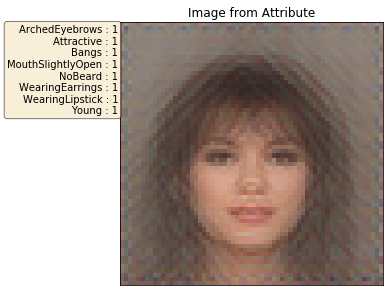

Epoch [186/200]...  ...349.014(s) feat_lo: 1.49849 - feat_med: 1.60079 - feat_hi: 1.78880 - attrib_rl: 0.25288 - KL img: 50.00000 - KL attrib: 50.00024 - ss: 11.39674
Epoch [187/200]...  ...349.004(s) feat_lo: 1.49852 - feat_med: 1.60075 - feat_hi: 1.78810 - attrib_rl: 0.25267 - KL img: 49.99990 - KL attrib: 50.00043 - ss: 11.39466
Epoch [188/200]...  ...349.348(s) feat_lo: 1.49822 - feat_med: 1.60044 - feat_hi: 1.78815 - attrib_rl: 0.25253 - KL img: 49.99902 - KL attrib: 49.99988 - ss: 11.39352
Epoch [189/200]...  ...349.279(s) feat_lo: 1.49823 - feat_med: 1.60045 - feat_hi: 1.78768 - attrib_rl: 0.25249 - KL img: 50.00022 - KL attrib: 49.99939 - ss: 11.39664
Epoch [190/200]...  ...349.128(s) feat_lo: 1.49848 - feat_med: 1.60087 - feat_hi: 1.78865 - attrib_rl: 0.25237 - KL img: 50.00067 - KL attrib: 50.00081 - ss: 11.39574


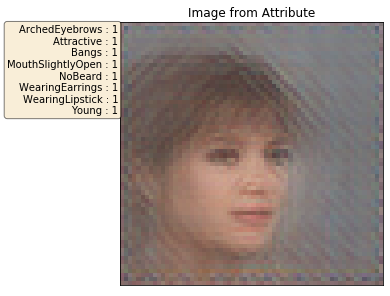

Epoch [191/200]...  ...348.923(s) feat_lo: 1.49779 - feat_med: 1.60007 - feat_hi: 1.78750 - attrib_rl: 0.25253 - KL img: 49.99895 - KL attrib: 49.99972 - ss: 11.39273
Epoch [192/200]...  ...348.887(s) feat_lo: 1.49769 - feat_med: 1.59999 - feat_hi: 1.78746 - attrib_rl: 0.25210 - KL img: 50.00064 - KL attrib: 49.99921 - ss: 11.39699
Epoch [193/200]...  ...349.017(s) feat_lo: 1.49786 - feat_med: 1.60033 - feat_hi: 1.78772 - attrib_rl: 0.25247 - KL img: 49.99996 - KL attrib: 50.00091 - ss: 11.39525
Epoch [194/200]...  ...349.278(s) feat_lo: 1.49763 - feat_med: 1.59999 - feat_hi: 1.78771 - attrib_rl: 0.25250 - KL img: 50.00072 - KL attrib: 49.99873 - ss: 11.39506
Epoch [195/200]...  ...349.165(s) feat_lo: 1.49769 - feat_med: 1.60007 - feat_hi: 1.78746 - attrib_rl: 0.25193 - KL img: 49.99887 - KL attrib: 50.00002 - ss: 11.39614


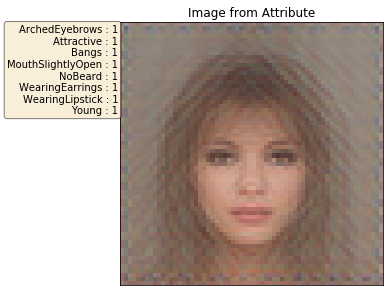

Epoch [196/200]...  ...350.477(s) feat_lo: 1.49783 - feat_med: 1.60010 - feat_hi: 1.78804 - attrib_rl: 0.25180 - KL img: 50.00089 - KL attrib: 50.00247 - ss: 11.39338
Epoch [197/200]...  ...361.993(s) feat_lo: 1.49749 - feat_med: 1.59989 - feat_hi: 1.78762 - attrib_rl: 0.25173 - KL img: 50.00024 - KL attrib: 50.00163 - ss: 11.39674
Epoch [198/200]...  ...361.763(s) feat_lo: 1.49764 - feat_med: 1.60004 - feat_hi: 1.78749 - attrib_rl: 0.25137 - KL img: 49.99948 - KL attrib: 49.99740 - ss: 11.39570
Epoch [199/200]...  ...361.613(s) feat_lo: 1.49758 - feat_med: 1.59985 - feat_hi: 1.78725 - attrib_rl: 0.25162 - KL img: 50.00101 - KL attrib: 49.99937 - ss: 11.39920
Epoch [200/200]...  ...360.567(s) feat_lo: 1.49733 - feat_med: 1.59972 - feat_hi: 1.78744 - attrib_rl: 0.25183 - KL img: 50.00015 - KL attrib: 50.00002 - ss: 11.39477


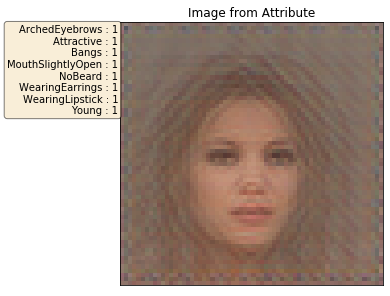

checkpointing at epoch: 200


In [1047]:
import time
from pathlib import Path

epochs = 200
batch_size = 64
checkpoint_every_n_epochs = 50
figure_every_n_epochs = 5

# control vae params
k_p = 0.01 # proportional constant
k_i_img = 0.0001 # integral constant
k_i_attrib = 0.0001 # integral constant
k_i_ss = 0.0001

i_t_img = 0 # discrete integrator for img vae
i_t_attrib = 0 # discrete integrator for attrib vae
beta_max = 1.0 
beta_min = 0.0
desired_kl = 50
beta_img = 0.0
beta_attrib = 0.0

# i_t_ss = 0
# gamma_max = 10.0
# gamma_min = 0.0
# gamma = 0.0
# desired_ss = 1

model_type = f'controlled-kl-ss-dfc-cross-vae-{desired_kl}kl-{desired_ss}ss'
# model_type = f'uncontrolled-kl-dfc-cross-vae'



#create base dir
base_model_path = Path(f'./models/{model_type}')
base_model_path.mkdir(parents=True, exist_ok=True)

#create figure dir
figure_model_path = base_model_path / 'figures'
figure_model_path.mkdir(parents=True, exist_ok=True)

#create checkpoint dir
checkpoints_model_path = base_model_path / 'checkpoints'
checkpoints_model_path.mkdir(parents=True, exist_ok=True)


with tf.device('gpu:0'):
    training_imgs = training_data[0]
    training_attribs = training_data[1]
    training_attribs  = np.cast['float32'](training_attribs)

    num_batches = len(training_imgs) // batch_size

    # losses
    rl_lo_loss_list = [] 
    rl_med_loss_list = [] 
    rl_hi_loss_list = [] 
    rl_loss_attrib_list = [] 
    ss_loss_list = [] 
    kl_loss_img_list = []
    kl_loss_attrib_list = []

    
    test_attribute = training_data[1][0]
    test_img = training_data[0][0]
    mu, sigma = 0, 1 #mean and standard deviation
    s = np.random.normal(mu, sigma, latent_dim)
    

    

    


    for epoch in range(1,epochs+1):
        start = time.time()
        print(f'Epoch [{epoch}/{epochs}]...'.ljust(20), end = '')


        
        idxs = np.arange(0,len(training_imgs))
        np.random.shuffle(idxs)
        
        img_input = training_imgs[idxs]
        attribute_input = training_attribs[idxs]


        rl_lo_loss_total = 0
        rl_med_loss_total = 0
        rl_hi_loss_total = 0
        rl_loss_attrib_total = 0
        ss_loss_total = 0
        kl_loss_img_total = 0
        kl_loss_attrib_total = 0

         

        
        
        for index in range(num_batches):
            img_batch = img_input[index*batch_size: batch_size*(index+1)]
            attribute_batch = attribute_input[index*batch_size: batch_size*(index+1)] 
            
            rl_lo_loss, rl_med_loss, rl_hi_loss, kl_loss_img, rl_loss_attrib, kl_loss_attrib, ss_loss = train_step(img_batch , attribute_batch, tf.constant(beta_img, dtype=tf.float32), tf.constant(beta_attrib, dtype=tf.float32))
            

            
            rl_lo_loss_total += K.get_value(rl_lo_loss)
            rl_med_loss_total += K.get_value(rl_med_loss)
            rl_hi_loss_total += K.get_value(rl_hi_loss)
            rl_loss_attrib_total += K.get_value(rl_loss_attrib)
            ss_loss_total += K.get_value(ss_loss)


            kl_loss_img_total += K.get_value(kl_loss_img)
            kl_loss_attrib_total += K.get_value(kl_loss_attrib)



            # control vae img
            error_t_img = desired_kl - K.get_value(kl_loss_img)
            p_t = k_p / (1+np.exp(error_t_img))

            if beta_min <= beta_img and beta_img <= beta_max:
                i_t_img = i_t_img - k_i_img*error_t_img

            beta_img = p_t + i_t_img + beta_min

            beta_img = min(beta_img, beta_max)
            beta_img = max(beta_img, beta_min)
            
            # control vae attrib
            error_t_attrib = desired_kl - K.get_value(kl_loss_attrib)
            p_t = k_p / (1+np.exp(error_t_attrib))

            if beta_min <= beta_attrib and beta_attrib <= beta_max:
                i_t_attrib = i_t_attrib - k_i_attrib*error_t_attrib

            beta_attrib = p_t + i_t_attrib + beta_min

            beta_attrib = min(beta_attrib, beta_max)
            beta_attrib = max(beta_attrib, beta_min)
            
            # control gamma for ss
#             error_t_ss = desired_ss - K.get_value(ss_loss)
#             p_t = k_p / (1+np.exp(error_t_ss))

#             if gamma_min <= gamma and gamma <= gamma_max:
#                 i_t_ss = i_t_ss - k_i_ss*error_t_ss

#             gamma = p_t + i_t_ss + gamma_min

#             gamma = min(gamma, gamma_max)
#             gamma = max(gamma, gamma_min)

        
        
       
        rl_lo_mean = rl_lo_loss_total/num_batches
        rl_med_mean = rl_med_loss_total/num_batches
        rl_hi_mean = rl_hi_loss_total/num_batches
        rl_attrib_mean = rl_loss_attrib_total/num_batches
        ss_mean = ss_loss_total/num_batches
        kl_loss_img_mean = kl_loss_img_total/num_batches
        kl_loss_attrib_mean = kl_loss_attrib_total/num_batches
        
        rl_lo_loss_list.append(rl_lo_mean) 
        rl_med_loss_list.append(rl_med_mean) 
        rl_hi_loss_list.append(rl_hi_mean)
        rl_loss_attrib_list.append(rl_attrib_mean)

        ss_loss_list.append(ss_mean)

        kl_loss_img_list.append(kl_loss_img_mean)
        kl_loss_attrib_list.append(kl_loss_attrib_mean)




        print(f'...{time.time()-start:.3f}(s) '  , end='')
       
        
        print(f'feat_lo: {rl_lo_mean:.5f} - ', end='') 
        print(f'feat_med: {rl_med_mean:.5f} - ', end='') 
        print(f'feat_hi: {rl_hi_mean:.5f} - ', end='') 
        print(f'attrib_rl: {rl_attrib_mean:.5f} - ', end='')         

        print(f'KL img: {kl_loss_img_mean:.5f} - ', end='')
        print(f'KL attrib: {kl_loss_attrib_mean:.5f} - ', end='')
        print(f'ss: {ss_mean:.5f}')


        

        if epoch % figure_every_n_epochs == 0:            
            attrib2img(test_attribute, title='Image from Attribute',save_dir='figures', name=f'{epoch}', save_fig=True)


        if epoch % checkpoint_every_n_epochs == 0 and epoch != 0:        
            print(f'checkpointing at epoch: {epoch}')
            image_decoder.save_weights((checkpoints_model_path / f'epoch-{epoch}-{model_type}-image_decoder-weights.h5').as_posix())
            image_decoder.save((checkpoints_model_path / f'epoch-{epoch}-{model_type}-image_decoder.h5').as_posix())
            image_encoder.save_weights((checkpoints_model_path / f'epoch-{epoch}-{model_type}-image_encoder-weights.h5').as_posix())
            image_encoder.save((checkpoints_model_path / f'epoch-{epoch}-{model_type}-image_encoder.h5').as_posix())            
            attribute_decoder.save_weights((checkpoints_model_path / f'epoch-{epoch}-{model_type}-attribute_decoder-weights.h5').as_posix())
            attribute_decoder.save((checkpoints_model_path / f'epoch-{epoch}-{model_type}-attribute_decoder.h5').as_posix())
            attribute_encoder.save_weights((checkpoints_model_path / f'epoch-{epoch}-{model_type}-attribute_encoder-weights.h5').as_posix())
            attribute_encoder.save((checkpoints_model_path / f'epoch-{epoch}-{model_type}-attribute_encoder.h5').as_posix())

In [78]:
def normalize(loss_list):
    loss_list = np.array(loss_list)
    return (loss_list - loss_list.min()) / (loss_list.max() - loss_list.min())

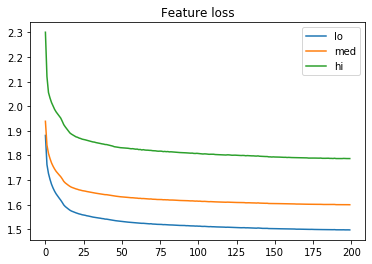

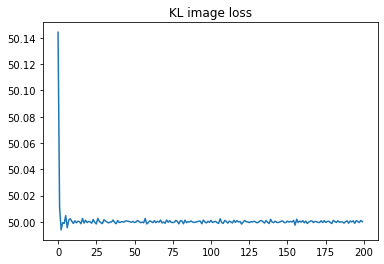

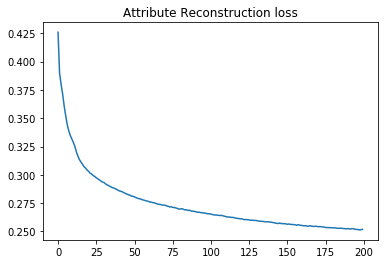

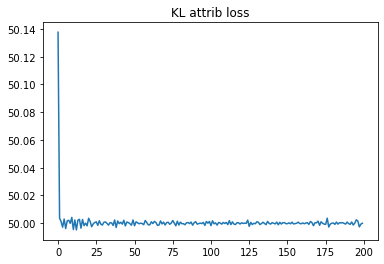

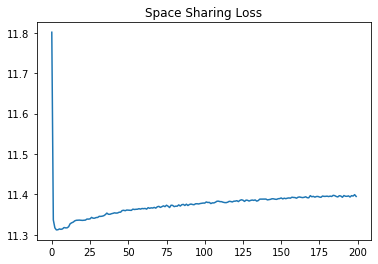

In [1048]:
plt.plot(rl_lo_loss_list, label="lo")
plt.plot(rl_med_loss_list, label="med")
plt.plot(rl_hi_loss_list, label="hi")
plt.title("Feature loss")
plt.legend()
plt.savefig(figure_model_path / 'feature_loss.png')
plt.show()
 
plt.plot(kl_loss_img_list)
plt.title("KL image loss")
plt.savefig(figure_model_path / 'KL_img_loss.png')
plt.show()

plt.plot(rl_loss_attrib_list)
plt.title("Attribute Reconstruction loss")
plt.savefig(figure_model_path / 'attrib_loss.png')
plt.show()
 
plt.plot(kl_loss_attrib_list)
plt.title("KL attrib loss")
plt.savefig(figure_model_path / 'KL_attrib_loss.png')
plt.show()

plt.plot(ss_loss_list)
plt.title("Space Sharing Loss")
plt.savefig(figure_model_path / 'space_sharing_loss.png')
plt.show()

In [36]:
from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
from IPython.display import display
from ipywidgets import HBox, Label
from ipywidgets import Layout, Button, Box

In [37]:
def get_attribs():
    attribs = '''5oClockShadow, ArchedEyebrows, Attractive, BagsUnderEyes, Bald, Bangs, BigLips, BigNose, BlackHair, BlondeHair, Blurry, BrownHair, BushyEyebrows, Chubby, DoubleChin, Glasses, Goatee, GrayHair, HeavyMakeup, HighCheekbones, Male, MouthSlightlyOpen, Mustache, NarrowEyes, NoBeard, OvalFace, PaleSkin, PointyNose, RecedingHairline, RosyCheeks, Sideburns, Smiling, StraightHair, WavyHair, WearingEarrings, WearingHat, WearingLipstick, WearingNecklace, WearingNecktie, Young'''
    attribs = attribs.split(',')
    attribs = [attrib.strip() for attrib in attribs]
    return attribs

In [38]:
attrib_dict = {attrib:i for i,attrib in enumerate(get_attribs())}

In [39]:
def generate(decoder, noise, attribute, name="untitled", show_attributes=False, save_fig=False):
    gen_img = unnormalize_tanh( decoder.predict([np.array([noise]),np.array([attribute])])[0])        
    plt.imshow(gen_img)

    ax = plt.gca()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    if show_attributes:
        props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
        txt = plt.text(65, 0, attribs_to_str(attribute), fontsize=10, bbox=props, va="top")
    plt.tight_layout()
    if save_fig:
        val_model_path = base_model_path / 'validation'
        val_model_path.mkdir(parents=True, exist_ok=True)
        plt.savefig(val_model_path / f'{name}.png',bbox_extra_artists=(txt,),bbox_inches = "tight")
    
    plt.show()
    


In [1085]:
sliders = []
items = []

items_layout = Layout( width='40%',display='flex')
labels_layout = Layout( display='flex', width='10%')

box_layout = Layout(display='flex',
                    flex_flow='column wrap',
                    align_items='center',
                    width='100%',
                    height='100%')
inner_box_layout = Layout(display='flex',
                    flex_flow='row nowrap',
                    align_items='center',
                    width='100%')

for attrib in get_attribs():
    slider = widgets.FloatSlider(
        min=-5,
        max=5,
        layout=items_layout,
        step=0.5,
        value=-1    )
#     slider = widgets.ToggleButtons(
#         options=[i for i in range(-5,6)],
#         value=-1, # Defaults to 'pineapple'
#     #    layout={'width': 'max-content'}, # If the items' names are long
#         layout=items_layout,
#         disabled=False)
    items.append(Box(children=[Label(attrib, layout=labels_layout),slider], layout=inner_box_layout))
    
#     slider = widgets.ToggleButtons(
#         options=[i for i in range(-5,6)],
#        value=-1, # Defaults to 'pineapple'
#     #    layout={'width': 'max-content'}, # If the items' names are long
#         layout=items_layout,
#         disabled=False
    sliders.append(slider)

    
box = Box(children=items, layout=box_layout)

# for label, slider in zip(labels,sliders):
# #     display(label)
# #     display(slider)

display(box)

Box(children=(Box(children=(Label(value='5oClockShadow', layout=Layout(display='flex', width='10%')), FloatSli…

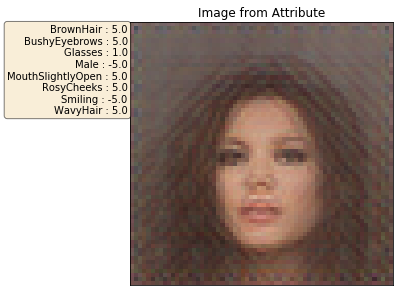

In [1145]:
conditions = np.array([slider.value for slider in sliders])
# conditions = test_attribute
# conditions = training_attribs[200]
mu, sigma = 0, 1 #mean and standard deviation
# noise = np.random.normal(mu, sigma,(1,200))

attrib2img(conditions, title='Image from Attribute',save_dir='figures', name='test' ,save_fig=True)
# _,_,z = attribute_encoder.predict(conditions.reshape(1,40))
# gen_img = unnormalize_tanh( image_decoder.predict(z)[0]) 
# plt.imshow(gen_img)
# plt.show()
# img2attrib(gen_img)



In [874]:

def img2attrib(image, title="", save_fig=False):
    _,_,z = image_encoder.predict(image.reshape(1,64,64,3))
    attribute = unnormalize_tanh( attribute_decoder.predict(z)[0]) 
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    txt = plt.text(-1, 0, attribs_to_str(attribute), fontsize=10, bbox=props, va="top", ha='right')
    plt.imshow(gen_img)
    ax = plt.gca()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    plt.tight_layout()
    plt.title(title)
    if save_fig:
        val_model_path = base_model_path / save_dir
        val_model_path.mkdir(parents=True, exist_ok=True)
        plt.savefig(val_model_path / f'{name}.png',bbox_extra_artists=(txt,),bbox_inches = "tight")
    plt.show()
    
def attrib2img(attribute, title="untitled", save_dir="untitled", name="untitled", save_fig=False):
    _,_,z = attribute_encoder.predict(attribute.reshape(1,40))
    gen_img = unnormalize_tanh( image_decoder.predict(z)[0]) 
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    txt = plt.text(-1, 0, attribs_to_str(attribute), fontsize=10, bbox=props, va="top", ha='right')
    plt.imshow(gen_img)
    ax = plt.gca()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    plt.tight_layout()
    plt.title(title)
    if save_fig:
        val_model_path = base_model_path / save_dir
        val_model_path.mkdir(parents=True, exist_ok=True)
        plt.savefig(val_model_path / f'{name}.png',bbox_extra_artists=(txt,),bbox_inches = "tight")
    plt.show()


In [1382]:
validation_generator = training_data_generator.flow_from_dataframe(
    dataframe=df,
    directory='../celeba-clean-64/',
    x_col="img",
    y_col=list(df.columns[1:]),
    target_size=(64, 64),
    subset='validation',
    shuffle=True,
    batch_size=256,
    class_mode='raw')

Found 40519 validated image filenames.


In [1383]:
val_data = validation_generator.next()

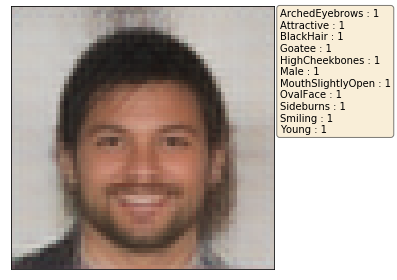

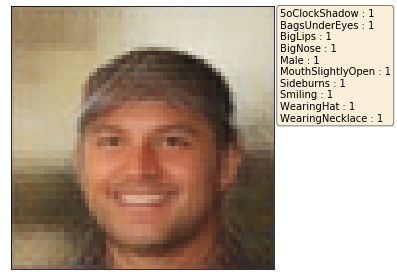

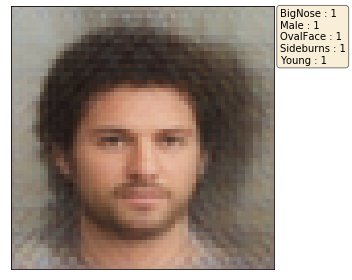

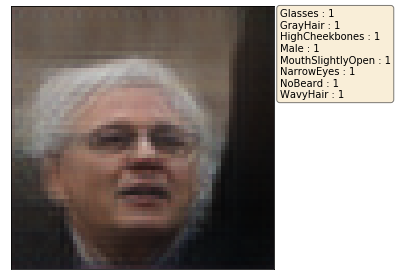

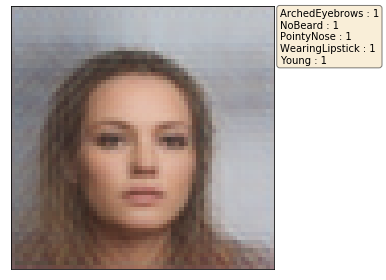

...

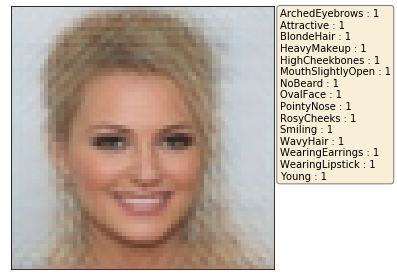

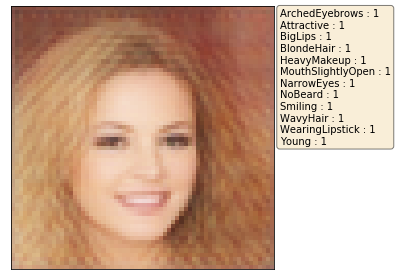

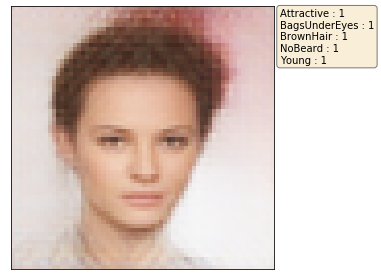

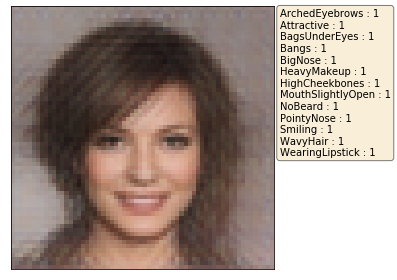

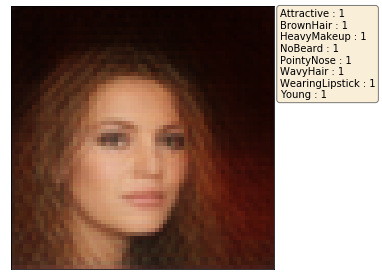

In [1381]:
for i, attribute in enumerate(val_data[1]):
    noise = np.random.normal(mu, sigma,200)
    generate(decoder,noise,attribute,name=f'val-{i}', show_attributes=True, save_fig=True)